<a href="https://colab.research.google.com/github/Ki-i/APRiL/blob/master/Copy_of_dncnn_220408.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
workspace_dir = '.'
#!unzip -q "/content/drive/My Drive/crypko_data.zip" -d "{workspace_dir}/"

In [ ]:
from torch.nn import Module
from torch import nn
import numpy as np
import math
import torch
from torch.nn import CrossEntropyLoss
from torch.nn import MSELoss
from torch.optim import SGD
from torch.utils.data import DataLoader, TensorDataset
import os
import torchvision.transforms as transforms
from torch.utils.data import Dataset
import matplotlib.pyplot as plt
import sys
import scipy.io as scio
import pylab

In [ ]:
class DnCNN(nn.Module):
    def __init__(self):
        super(DnCNN, self).__init__()
        channels=1
        num_of_layers=10
        kernel_size = 3
        padding = 1
        features = 64
        layers = []
        layers.append(nn.Conv2d(in_channels=channels, out_channels=features, kernel_size=kernel_size, padding=padding, bias=False))
        layers.append(nn.ReLU(inplace=True))
        for _ in range(num_of_layers-2):
            layers.append(nn.Conv2d(in_channels=features, out_channels=features, kernel_size=kernel_size, padding=padding, bias=False))
            layers.append(nn.BatchNorm2d(features))
            layers.append(nn.ReLU(inplace=True))
        layers.append(nn.Conv2d(in_channels=features, out_channels=channels, kernel_size=kernel_size, padding=padding, bias=False))
        self.dncnn = nn.Sequential(*layers)
    def forward(self, x):
        y = self.dncnn(x)
        #print(y.size())
        return y

In [ ]:
class Model(Module):
    def __init__(self):
        super(Model, self).__init__()
        #self.conv1 = nn.Conv2d(3, 32, 5)
        self.conv1 = nn.Conv2d(1, 32, 3)#输入通道数，输出通道数，卷积核大小
        self.relu1 = nn.ReLU()
        self.pool1 = nn.MaxPool2d(2)
        self.conv2 = nn.Conv2d(32, 64, 3)
        self.relu2 = nn.ReLU()
        self.pool2 = nn.MaxPool2d(2)
        self.conv3 = nn.Conv2d(64, 64, 3)
        self.relu3 = nn.ReLU()
        self.pool3 = nn.MaxPool2d(2)
        self.fc1 = nn.Linear( 64* 22* 47, 64*99)
        self.relu3 = nn.ReLU()
        self.fc2 = nn.Linear(64*99, 50*100)
        self.dropout = nn.Dropout(p=0.3)  # dropout训练

    def forward(self, x):
        y = self.conv1(x)
        y = self.relu1(y)
        #y = self.pool1(y)
        y = self.conv2(y)
        y = self.relu2(y)
        #y = self.pool2(y)
        y = self.conv3(y)
        y = self.relu3(y)
        y = self.pool3(y)
        #print(y.size())
        y = y.view(y.shape[0], -1)
        y = self.fc1(y)
        y = self.dropout(y)
        y = self.relu3(y)
        y = self.fc2(y)
        # y = self.relu4(y)
        # y = self.fc3(y)
        # y = self.relu5(y)
        #print(y)
        return y

In [ ]:
def psnr(target_data, ref_data):
    # target:目标图像  ref:参考图像  scale:尺寸大小
    # assume RGB image
    #target_data = np.array(target)
    #target_data = target_data[scale:-scale, scale:-scale]

    #ref_data = np.array(ref)
    #ref_data = ref_data[scale:-scale, scale:-scale]
    im = ref_data.max()
    print('参考图像峰值', ref_data.max(), ref_data.min())
    print('实际图像峰值', target_data.max(), target_data.min())
    target_data = target_data * (ref_data.max() / target_data.max())
    #print('实际图像峰值', target_data.max(), target_data.min())
    diff = ref_data - target_data
    diff = diff.flatten('C')

    #rmse = math.sqrt(np.mean(diff ** 2.))
    #return 20 * math.log10(math.pow(im,2) / rmse)
    mse = np.mean(diff ** 2.)
    return 20 * math.log10(math.pow(im,2) / mse)

In [ ]:
def get_data(dataset_path, fm_x, fm_y, dev_ratio):
    print("load data from path1:", dataset_path)
    x_data = scio.loadmat(os.path.join(dataset_path, fm_x))
    y_data = scio.loadmat(os.path.join(dataset_path, fm_y))
    del x_data['__header__']
    del x_data['__globals__']
    del x_data['__version__']
    del y_data['__header__']
    del y_data['__globals__']
    del y_data['__version__']
    # print(x_data.keys())
    # print(y_data.keys())
    # print(int(len(x_data)/3))
    #datalen = int(len(x_data) / 3)
    datalen=6000
    x = np.zeros((datalen, 50, 100), dtype=np.float)
    y = np.zeros((datalen, 50, 100), dtype=np.float)
    for i in range(1, datalen):
        xkey = 'rt' + str(i)
        #print(xkey)
        x[i] = x_data[xkey]
        
        ykey = 'ri' + str(i)
        y[i] = x_data[xkey]-y_data[ykey]#噪声
        #if i==1:
        #  print(x[1])
        #  print(y_data[ykey])
        #  print(y[1])
        

    data_size = len(y)
    train_size = int(data_size * (1 - dev_ratio))
    state = np.random.get_state()
    np.random.shuffle(x)
    np.random.set_state(state)
    np.random.shuffle(y)
    # print("train size:", train_size)
    # print("dev size:", data_size - train_size)
    x_train = x[:train_size]
    y_train = y[:train_size]
    x_dev = x[train_size:]
    y_dev = y[train_size:]
    return x_train, y_train, x_dev, y_dev

In [ ]:
class MyDataset(Dataset):
    def __init__(self, x, y):
        self.x, self.y = x, y
        self.data_size = len(self.y)
        #norm_mean = [0.485, 0.456, 0.406]
        #norm_std = [0.229, 0.224, 0.225]
        self.img_transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.ToTensor(),
            # transforms.Normalize(norm_mean, norm_std),
        ])

    def __len__(self):
        return self.data_size

    def __getitem__(self, item):
        '''
        这个函数是关键，通过item(索引)来取数据集中的数据，
        一般来说在这里才将图像数据加载入内存，之前存的是图像的保存路径
        '''
        ycut=self.y[item]
        #ycut=ycut[101:-6:400,1:-5:500]

        label = torch.from_numpy(ycut)
        #label = torch.reshape(label, (1, -1))
        xcut = self.x[item]
        #xcut = xcut[101:-6:400,1:-5:500]
        x = torch.from_numpy(xcut)
        x=x.unsqueeze(0)
        label=label.squeeze(0)
        x=x.float()
        label=label.float()
        x = torch.div(x, 255.)
        label=torch.div(label, 255.)
        return x, label

In [ ]:
x=np.array([1,2,3,4])
x=x/4
print(x)

[0.25 0.5  0.75 1.  ]


load data from path1: /content/drive/My Drive/


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:520: UserWarning: Using a targ

-------------------------------------------------------------------------------------------------------------------------------------
epoch 1.0000 ,train loss: 2990.7835, dev loss: 1139.7406
-------------------------------------------------------------------------------------------------------------------------------------


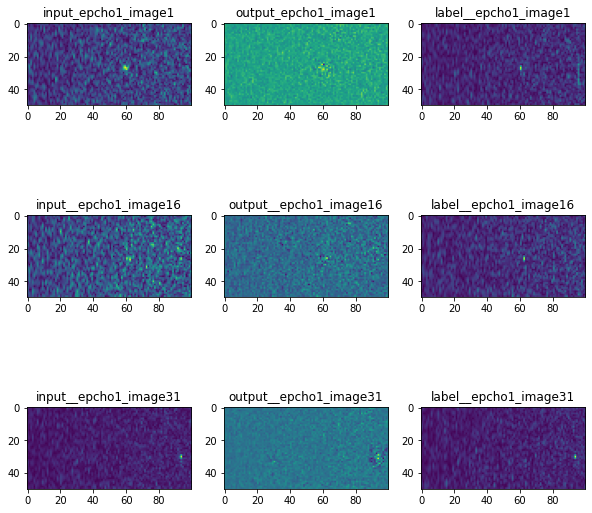

-------------------------------------------------------------------------------------------------------------------------------------
epoch 2.0000 ,train loss: 1064.8431, dev loss: 621.9385
-------------------------------------------------------------------------------------------------------------------------------------


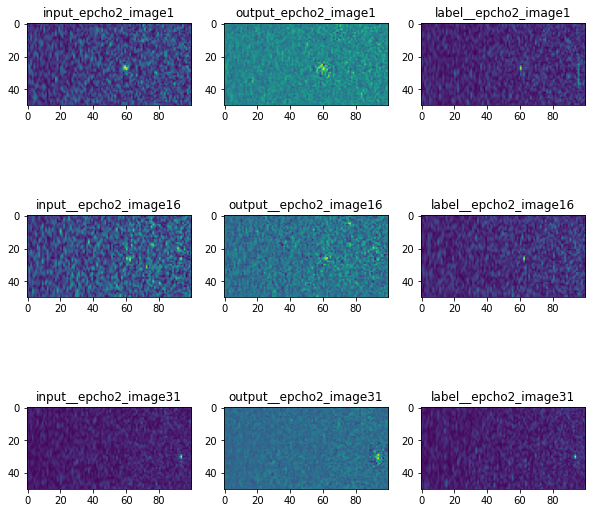

-------------------------------------------------------------------------------------------------------------------------------------
epoch 3.0000 ,train loss: 707.6335, dev loss: 469.4328
-------------------------------------------------------------------------------------------------------------------------------------


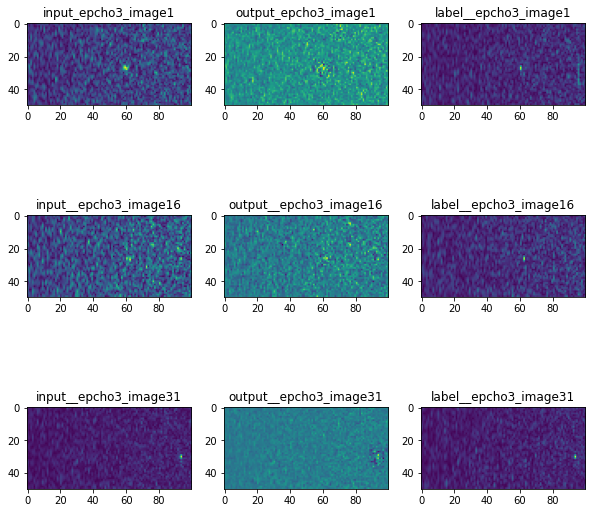

-------------------------------------------------------------------------------------------------------------------------------------
epoch 4.0000 ,train loss: 524.1300, dev loss: 463.8461
-------------------------------------------------------------------------------------------------------------------------------------


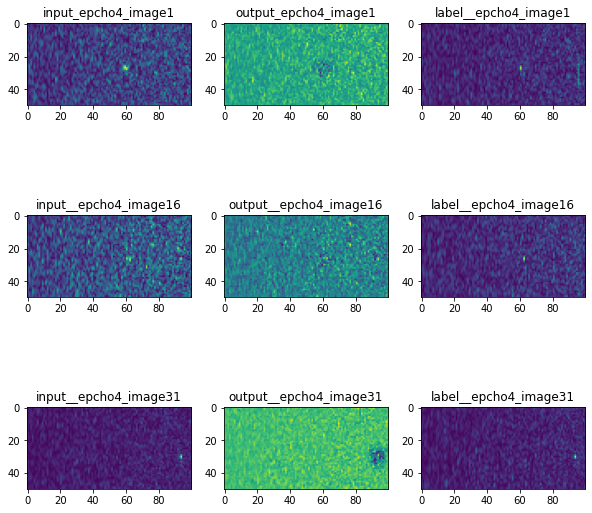

-------------------------------------------------------------------------------------------------------------------------------------
epoch 5.0000 ,train loss: 462.4355, dev loss: 375.7024
-------------------------------------------------------------------------------------------------------------------------------------


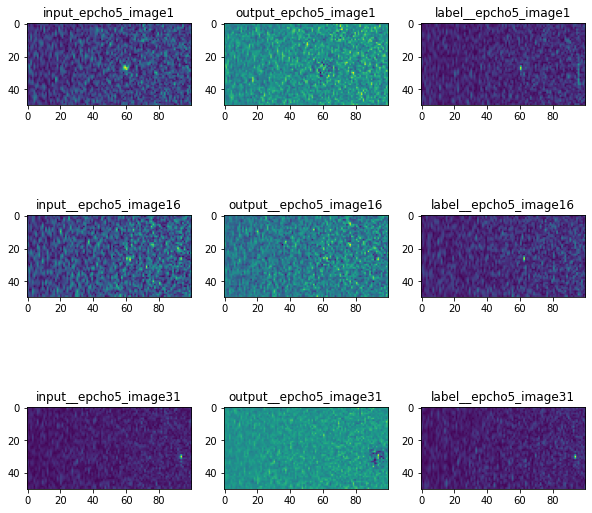

-------------------------------------------------------------------------------------------------------------------------------------
epoch 6.0000 ,train loss: 409.1385, dev loss: 353.5370
-------------------------------------------------------------------------------------------------------------------------------------


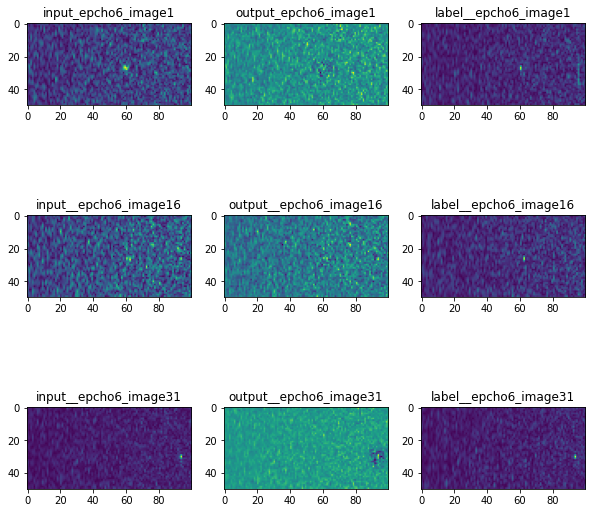

-------------------------------------------------------------------------------------------------------------------------------------
epoch 7.0000 ,train loss: 378.8617, dev loss: 328.9641
-------------------------------------------------------------------------------------------------------------------------------------


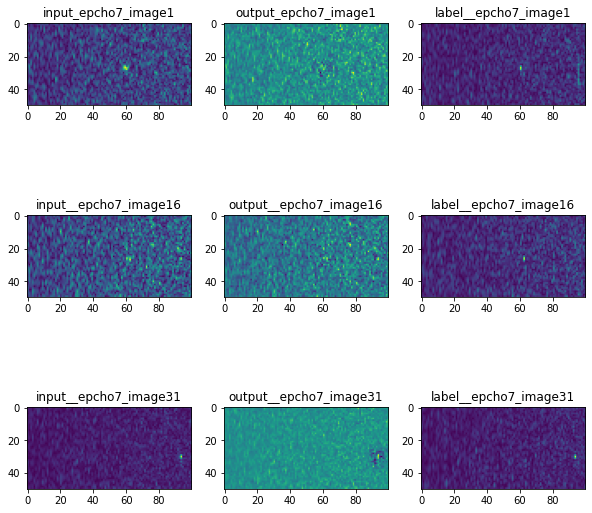

-------------------------------------------------------------------------------------------------------------------------------------
epoch 8.0000 ,train loss: 355.8057, dev loss: 314.8951
-------------------------------------------------------------------------------------------------------------------------------------


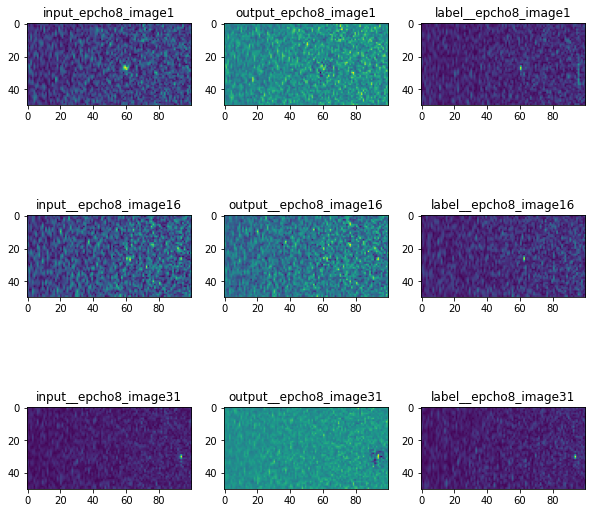

-------------------------------------------------------------------------------------------------------------------------------------
epoch 9.0000 ,train loss: 341.4951, dev loss: 304.1116
-------------------------------------------------------------------------------------------------------------------------------------


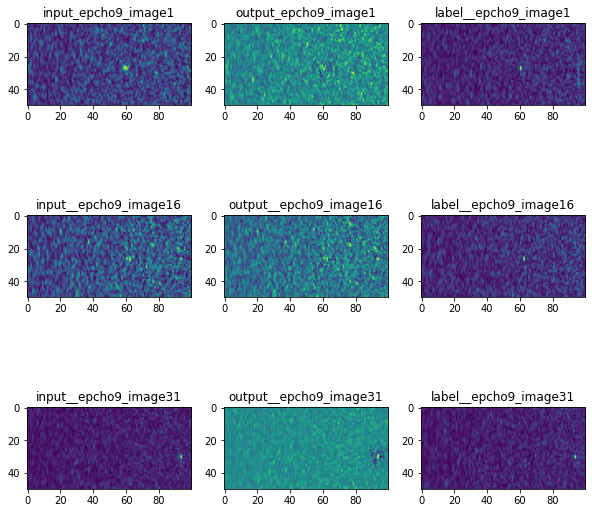

-------------------------------------------------------------------------------------------------------------------------------------
epoch 10.0000 ,train loss: 328.3113, dev loss: 294.7499
-------------------------------------------------------------------------------------------------------------------------------------


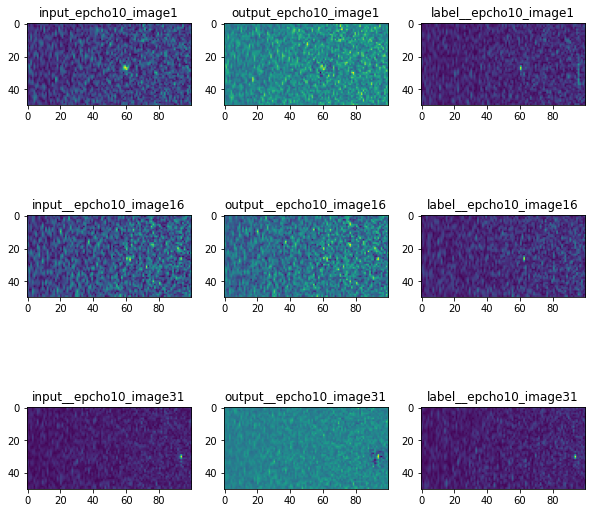

-------------------------------------------------------------------------------------------------------------------------------------
epoch 11.0000 ,train loss: 318.9837, dev loss: 288.6991
-------------------------------------------------------------------------------------------------------------------------------------


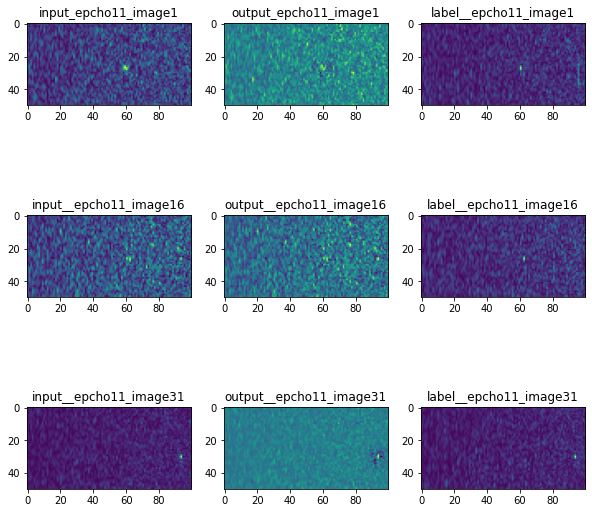

-------------------------------------------------------------------------------------------------------------------------------------
epoch 12.0000 ,train loss: 311.9151, dev loss: 283.3938
-------------------------------------------------------------------------------------------------------------------------------------


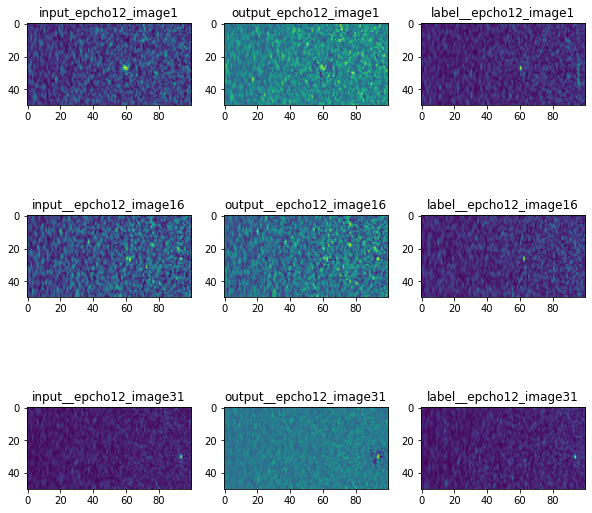

-------------------------------------------------------------------------------------------------------------------------------------
epoch 13.0000 ,train loss: 305.5472, dev loss: 278.7570
-------------------------------------------------------------------------------------------------------------------------------------


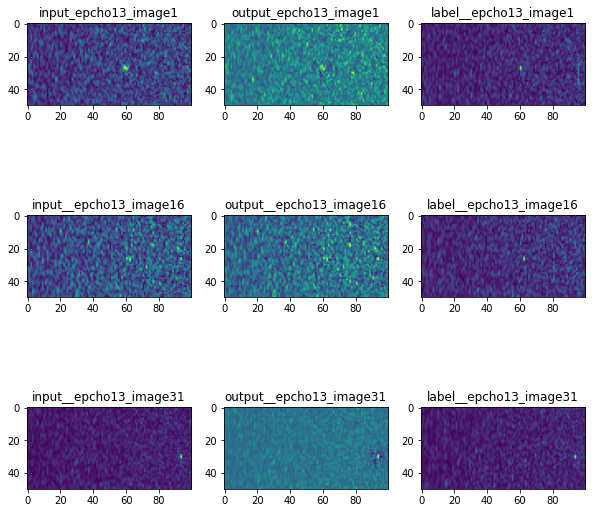

-------------------------------------------------------------------------------------------------------------------------------------
epoch 14.0000 ,train loss: 300.4277, dev loss: 275.0846
-------------------------------------------------------------------------------------------------------------------------------------


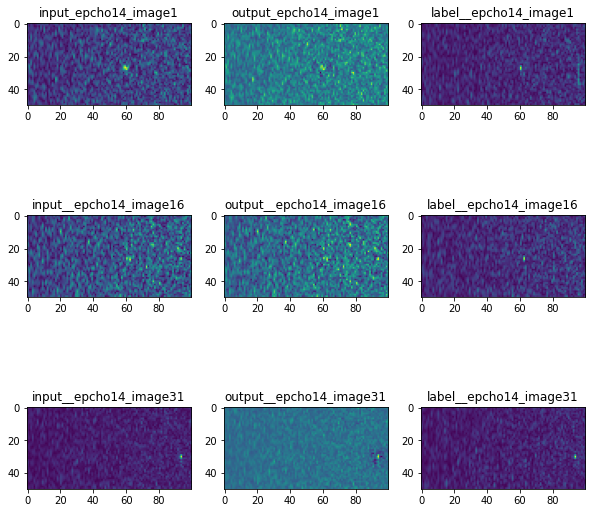

-------------------------------------------------------------------------------------------------------------------------------------
epoch 15.0000 ,train loss: 296.0686, dev loss: 271.9240
-------------------------------------------------------------------------------------------------------------------------------------


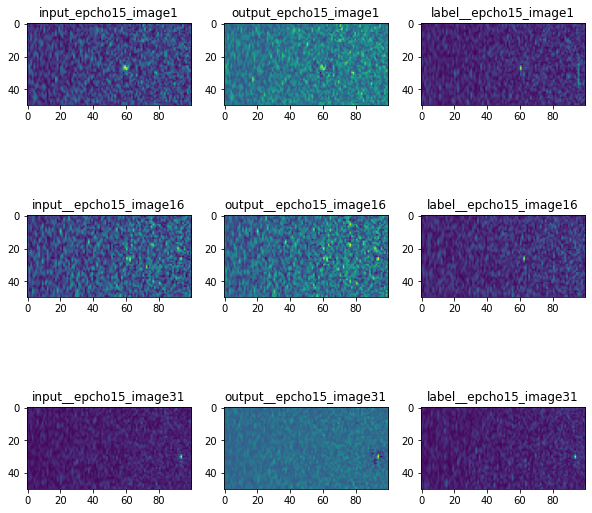

-------------------------------------------------------------------------------------------------------------------------------------
epoch 16.0000 ,train loss: 292.2677, dev loss: 269.1391
-------------------------------------------------------------------------------------------------------------------------------------


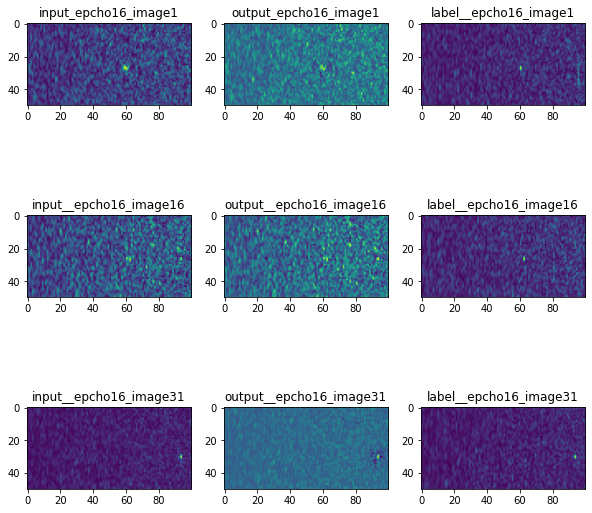

-------------------------------------------------------------------------------------------------------------------------------------
epoch 17.0000 ,train loss: 289.0314, dev loss: 266.7740
-------------------------------------------------------------------------------------------------------------------------------------


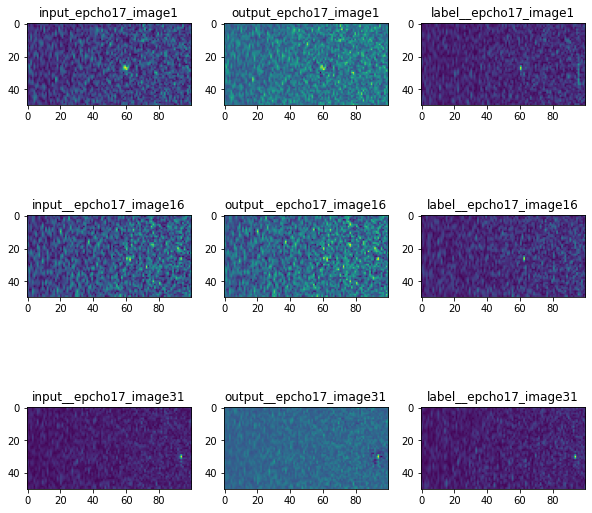

-------------------------------------------------------------------------------------------------------------------------------------
epoch 18.0000 ,train loss: 286.2744, dev loss: 264.7821
-------------------------------------------------------------------------------------------------------------------------------------


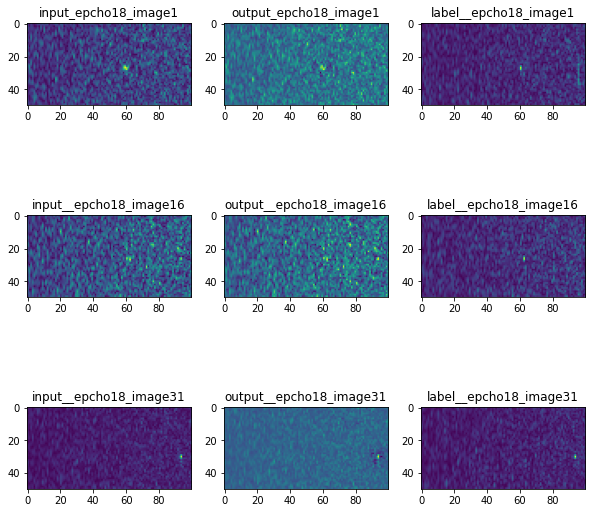

-------------------------------------------------------------------------------------------------------------------------------------
epoch 19.0000 ,train loss: 283.9234, dev loss: 263.1179
-------------------------------------------------------------------------------------------------------------------------------------


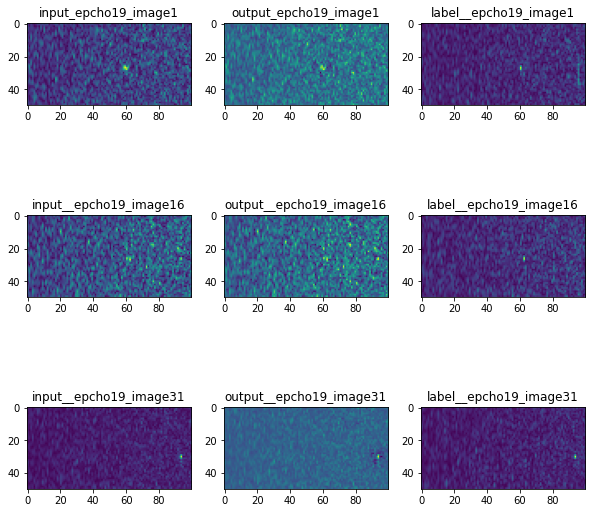

-------------------------------------------------------------------------------------------------------------------------------------
epoch 20.0000 ,train loss: 281.7066, dev loss: 261.4672
-------------------------------------------------------------------------------------------------------------------------------------


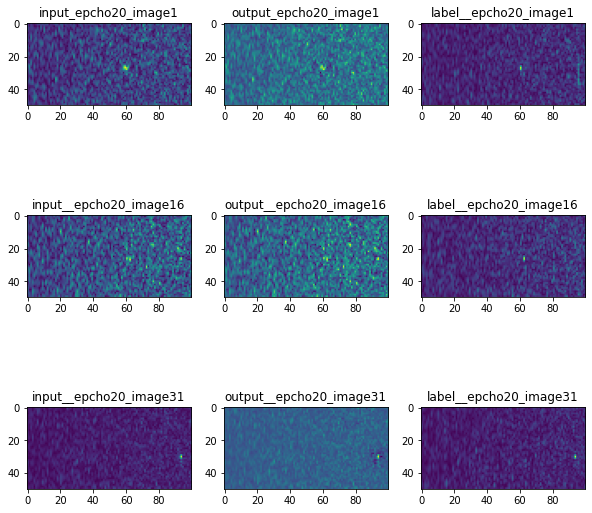

-------------------------------------------------------------------------------------------------------------------------------------
epoch 21.0000 ,train loss: 279.6466, dev loss: 259.9765
-------------------------------------------------------------------------------------------------------------------------------------


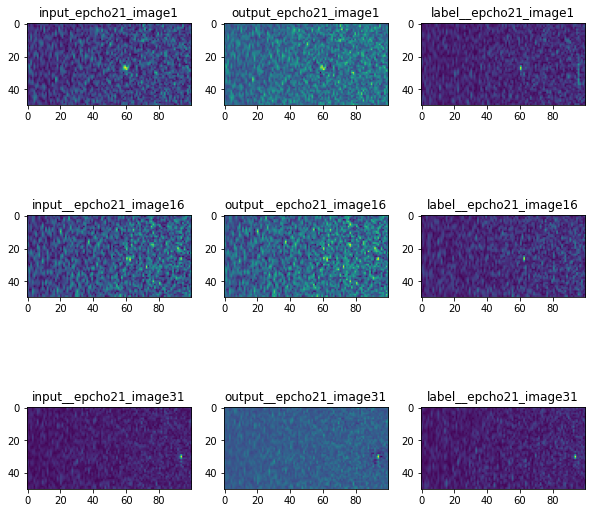

-------------------------------------------------------------------------------------------------------------------------------------
epoch 22.0000 ,train loss: 277.8463, dev loss: 258.6782
-------------------------------------------------------------------------------------------------------------------------------------


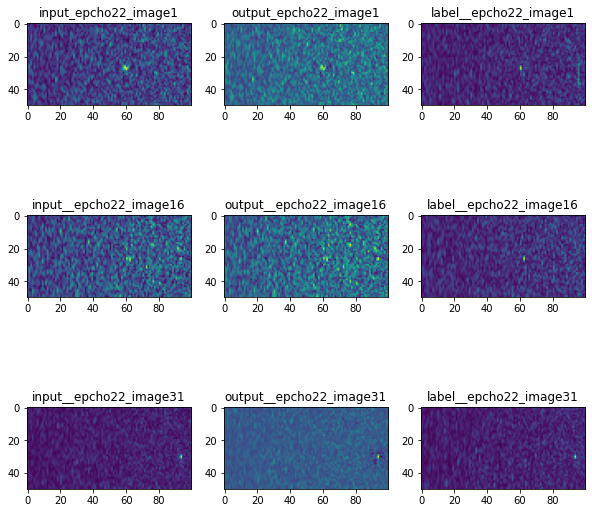

-------------------------------------------------------------------------------------------------------------------------------------
epoch 23.0000 ,train loss: 276.1885, dev loss: 257.4268
-------------------------------------------------------------------------------------------------------------------------------------


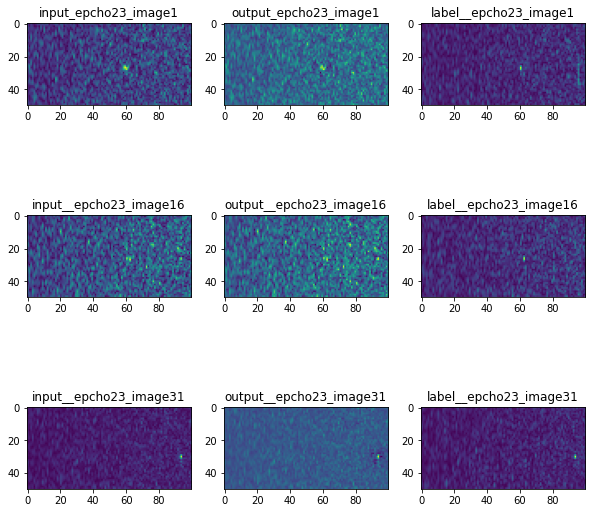

-------------------------------------------------------------------------------------------------------------------------------------
epoch 24.0000 ,train loss: 274.6519, dev loss: 256.2523
-------------------------------------------------------------------------------------------------------------------------------------


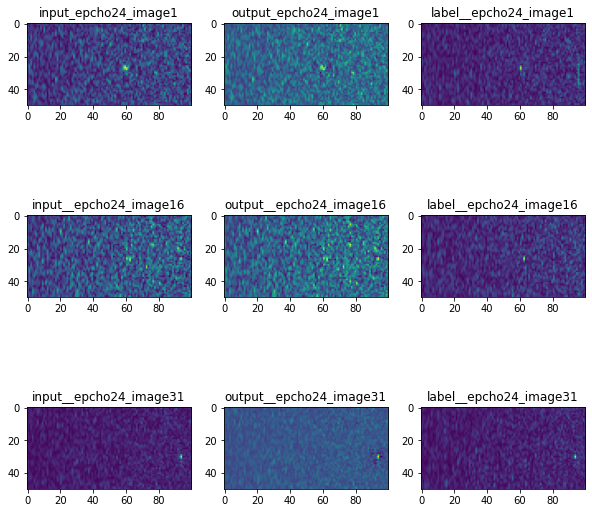

-------------------------------------------------------------------------------------------------------------------------------------
epoch 25.0000 ,train loss: 273.2538, dev loss: 255.1909
-------------------------------------------------------------------------------------------------------------------------------------


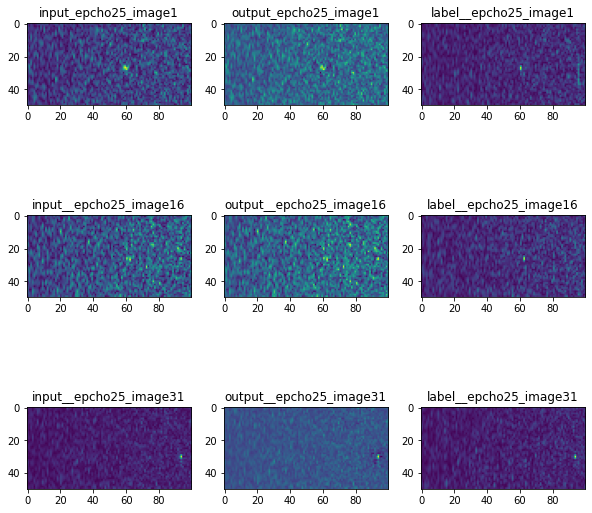

-------------------------------------------------------------------------------------------------------------------------------------
epoch 26.0000 ,train loss: 271.9892, dev loss: 254.2121
-------------------------------------------------------------------------------------------------------------------------------------


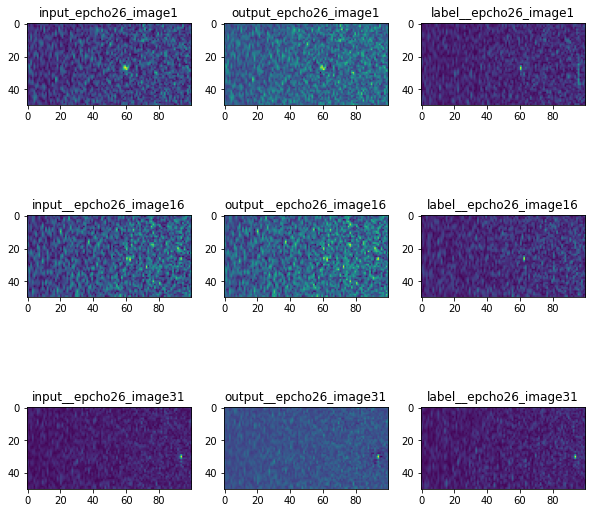

-------------------------------------------------------------------------------------------------------------------------------------
epoch 27.0000 ,train loss: 270.8098, dev loss: 253.2997
-------------------------------------------------------------------------------------------------------------------------------------


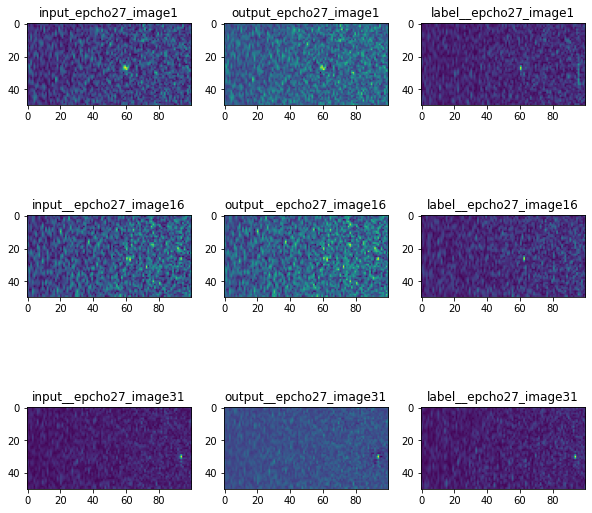

-------------------------------------------------------------------------------------------------------------------------------------
epoch 28.0000 ,train loss: 269.7478, dev loss: 252.4838
-------------------------------------------------------------------------------------------------------------------------------------


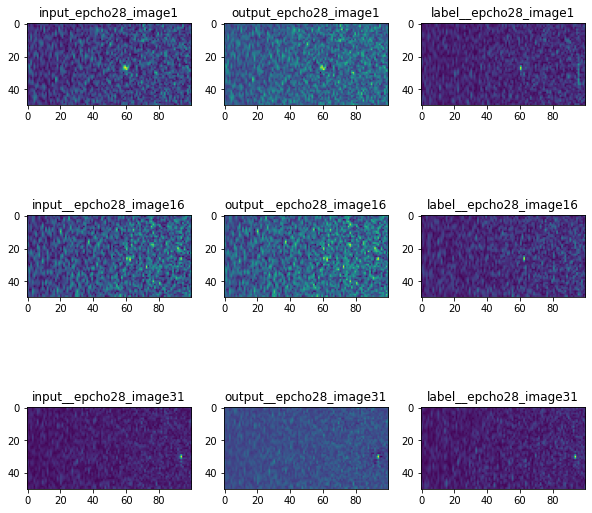

-------------------------------------------------------------------------------------------------------------------------------------
epoch 29.0000 ,train loss: 268.8060, dev loss: 251.7803
-------------------------------------------------------------------------------------------------------------------------------------


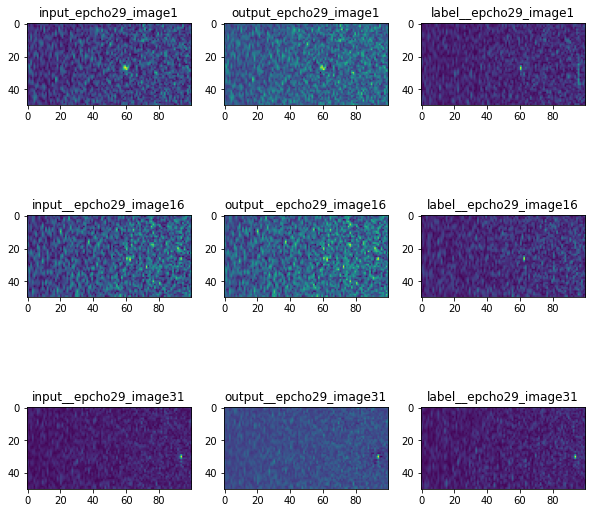

-------------------------------------------------------------------------------------------------------------------------------------
epoch 30.0000 ,train loss: 267.9520, dev loss: 251.1254
-------------------------------------------------------------------------------------------------------------------------------------


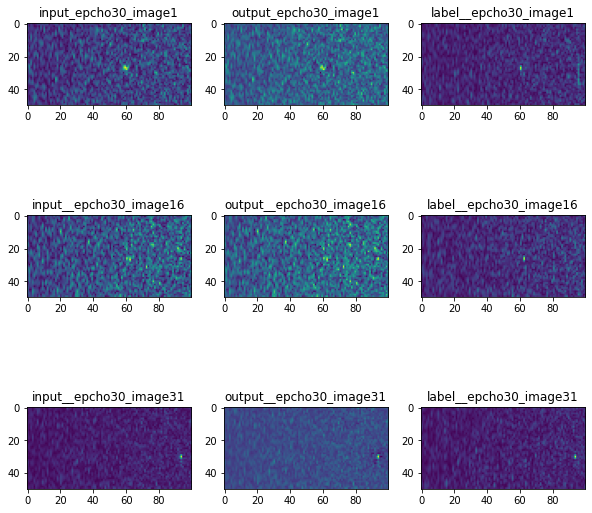

-------------------------------------------------------------------------------------------------------------------------------------
epoch 31.0000 ,train loss: 267.1397, dev loss: 250.4707
-------------------------------------------------------------------------------------------------------------------------------------


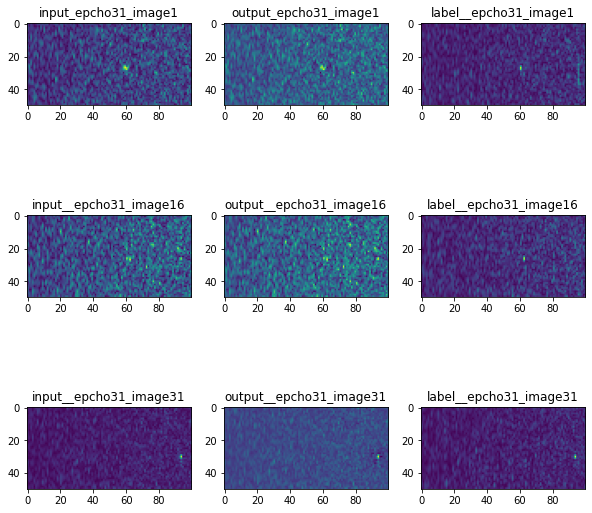

-------------------------------------------------------------------------------------------------------------------------------------
epoch 32.0000 ,train loss: 266.3463, dev loss: 249.8166
-------------------------------------------------------------------------------------------------------------------------------------


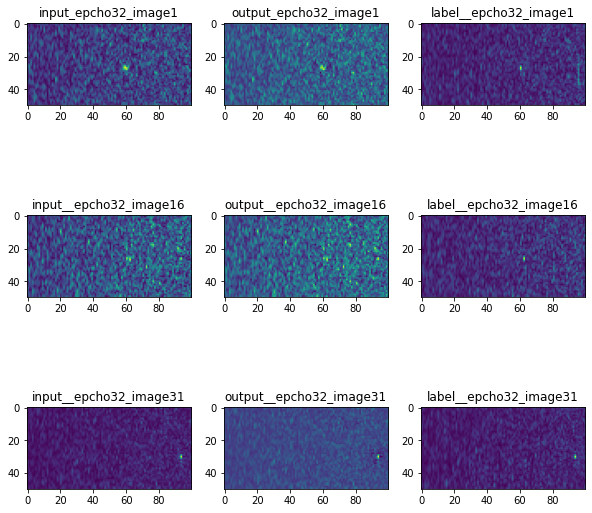

-------------------------------------------------------------------------------------------------------------------------------------
epoch 33.0000 ,train loss: 265.5818, dev loss: 249.2056
-------------------------------------------------------------------------------------------------------------------------------------


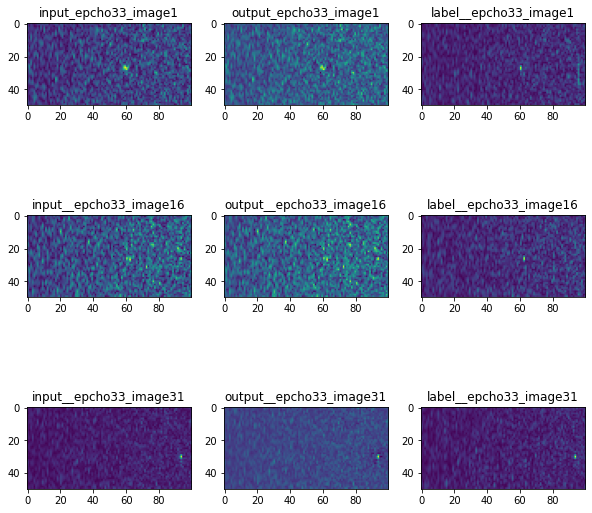

-------------------------------------------------------------------------------------------------------------------------------------
epoch 34.0000 ,train loss: 264.8960, dev loss: 248.6856
-------------------------------------------------------------------------------------------------------------------------------------


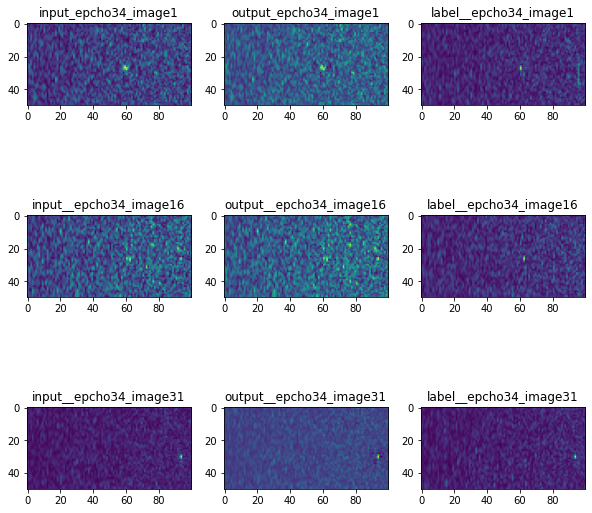

-------------------------------------------------------------------------------------------------------------------------------------
epoch 35.0000 ,train loss: 264.3057, dev loss: 248.2509
-------------------------------------------------------------------------------------------------------------------------------------


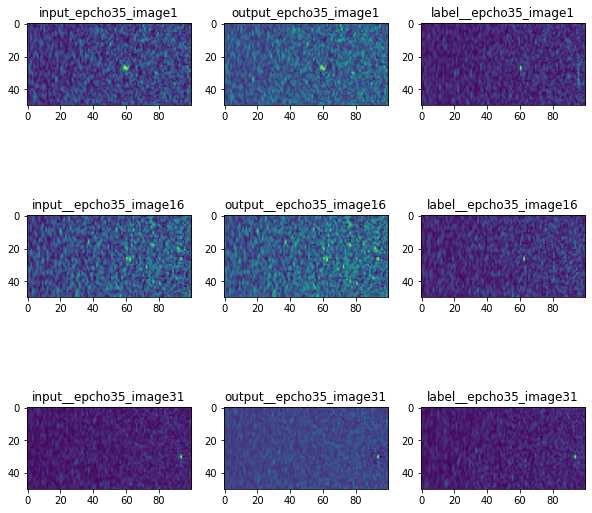

-------------------------------------------------------------------------------------------------------------------------------------
epoch 36.0000 ,train loss: 263.7765, dev loss: 247.8528
-------------------------------------------------------------------------------------------------------------------------------------


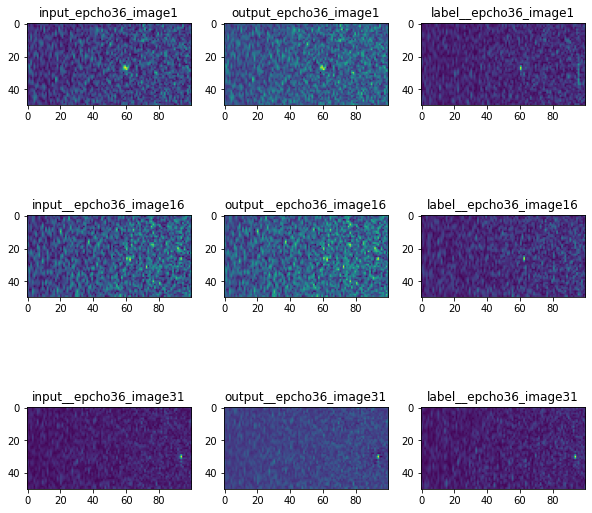

-------------------------------------------------------------------------------------------------------------------------------------
epoch 37.0000 ,train loss: 263.2567, dev loss: 247.4353
-------------------------------------------------------------------------------------------------------------------------------------


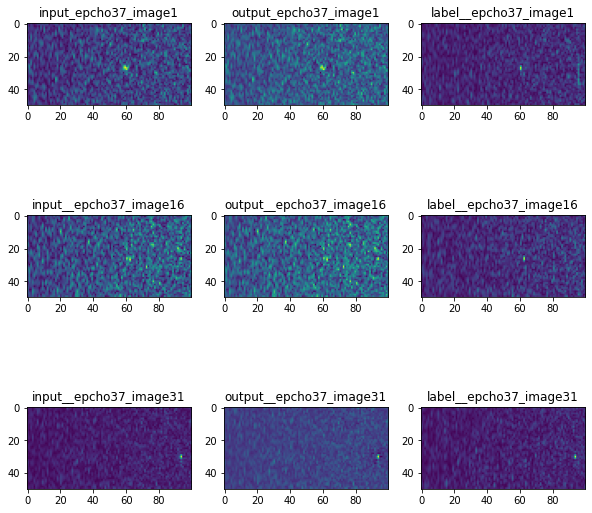

-------------------------------------------------------------------------------------------------------------------------------------
epoch 38.0000 ,train loss: 262.7186, dev loss: 246.9695
-------------------------------------------------------------------------------------------------------------------------------------


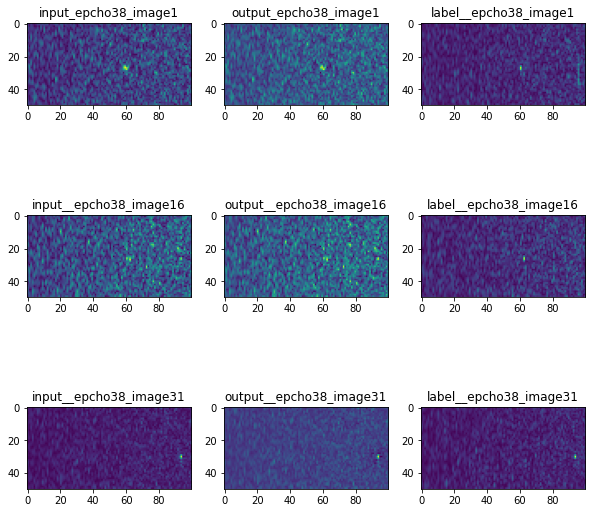

-------------------------------------------------------------------------------------------------------------------------------------
epoch 39.0000 ,train loss: 262.1628, dev loss: 246.4763
-------------------------------------------------------------------------------------------------------------------------------------


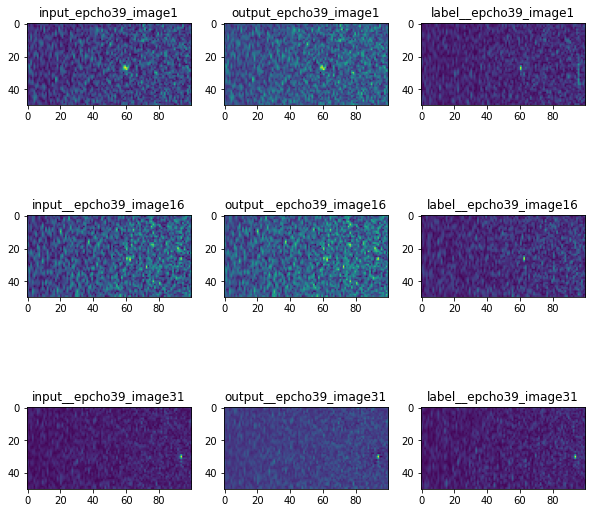

-------------------------------------------------------------------------------------------------------------------------------------
epoch 40.0000 ,train loss: 261.6257, dev loss: 246.0177
-------------------------------------------------------------------------------------------------------------------------------------


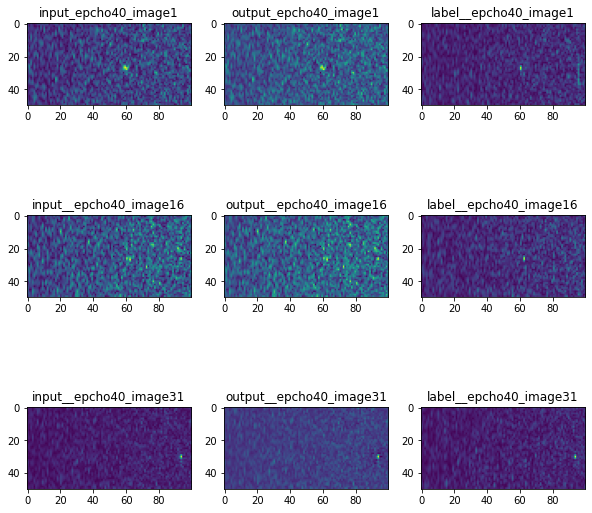

-------------------------------------------------------------------------------------------------------------------------------------
epoch 41.0000 ,train loss: 261.1565, dev loss: 245.6451
-------------------------------------------------------------------------------------------------------------------------------------


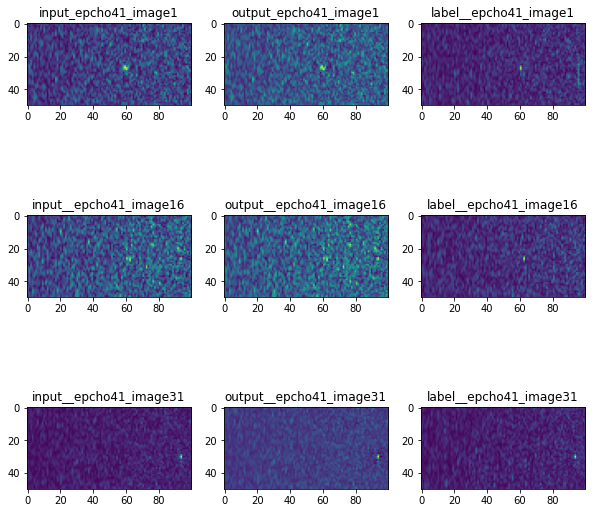

-------------------------------------------------------------------------------------------------------------------------------------
epoch 42.0000 ,train loss: 260.7694, dev loss: 245.3645
-------------------------------------------------------------------------------------------------------------------------------------


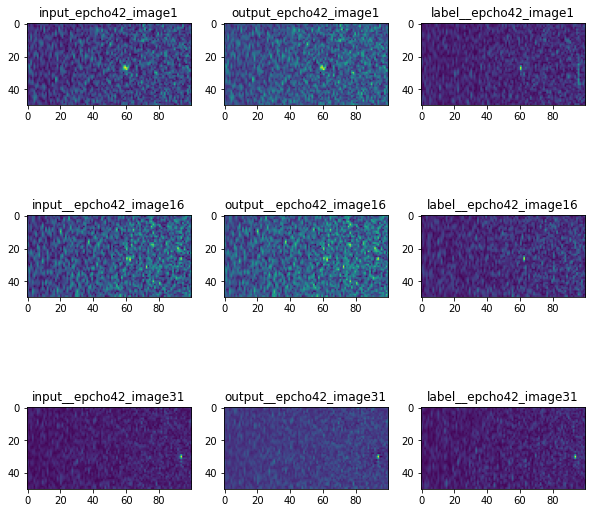

-------------------------------------------------------------------------------------------------------------------------------------
epoch 43.0000 ,train loss: 260.4492, dev loss: 245.1471
-------------------------------------------------------------------------------------------------------------------------------------


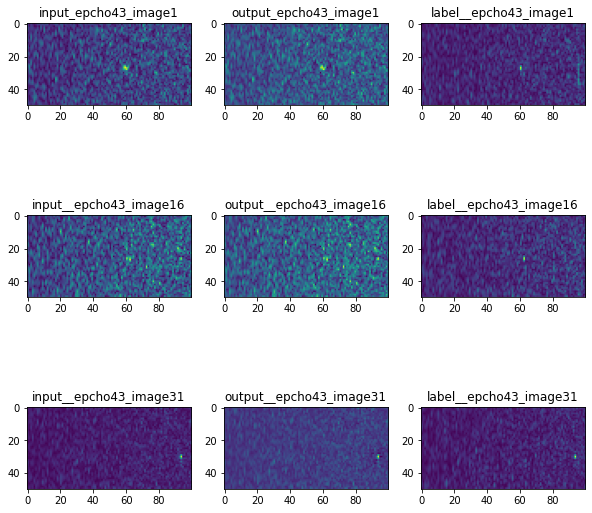

-------------------------------------------------------------------------------------------------------------------------------------
epoch 44.0000 ,train loss: 260.1678, dev loss: 244.9493
-------------------------------------------------------------------------------------------------------------------------------------


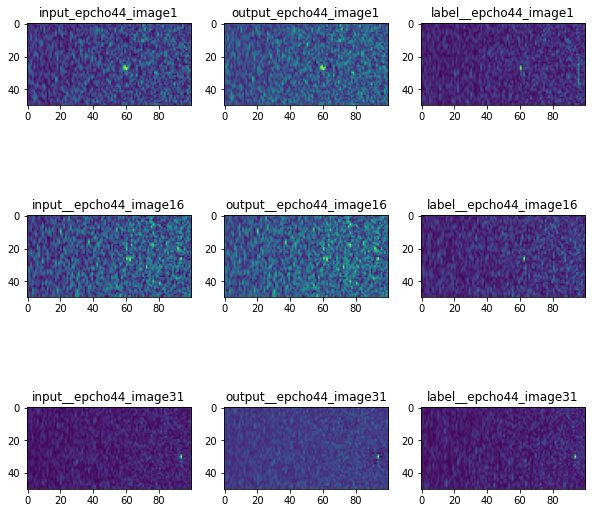

-------------------------------------------------------------------------------------------------------------------------------------
epoch 45.0000 ,train loss: 259.8739, dev loss: 244.6956
-------------------------------------------------------------------------------------------------------------------------------------


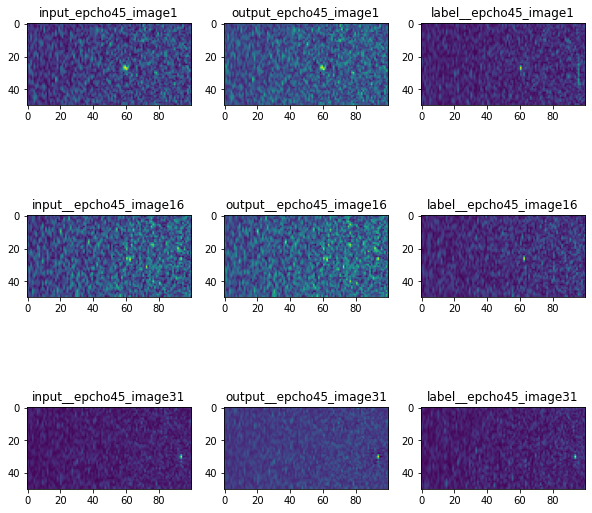

-------------------------------------------------------------------------------------------------------------------------------------
epoch 46.0000 ,train loss: 259.5210, dev loss: 244.3163
-------------------------------------------------------------------------------------------------------------------------------------


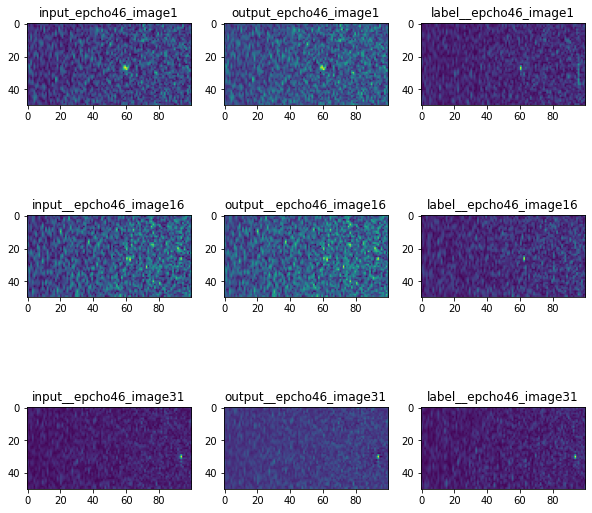

-------------------------------------------------------------------------------------------------------------------------------------
epoch 47.0000 ,train loss: 259.0771, dev loss: 243.7822
-------------------------------------------------------------------------------------------------------------------------------------


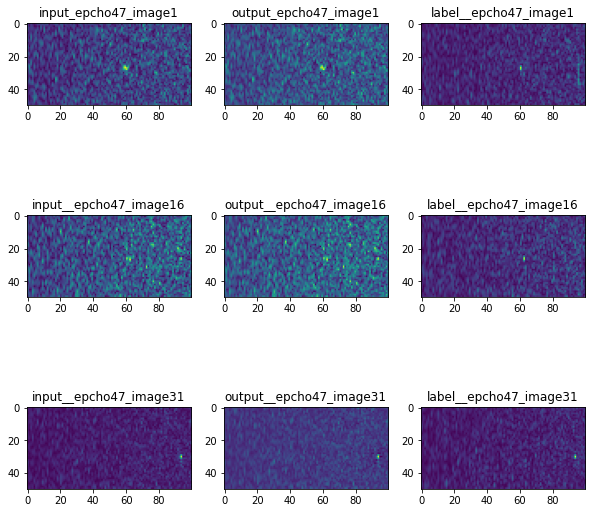

-------------------------------------------------------------------------------------------------------------------------------------
epoch 48.0000 ,train loss: 258.5386, dev loss: 243.0861
-------------------------------------------------------------------------------------------------------------------------------------


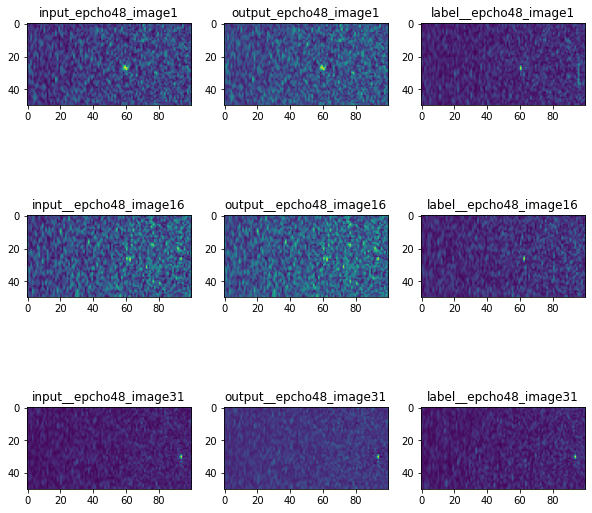

-------------------------------------------------------------------------------------------------------------------------------------
epoch 49.0000 ,train loss: 257.9219, dev loss: 242.2556
-------------------------------------------------------------------------------------------------------------------------------------


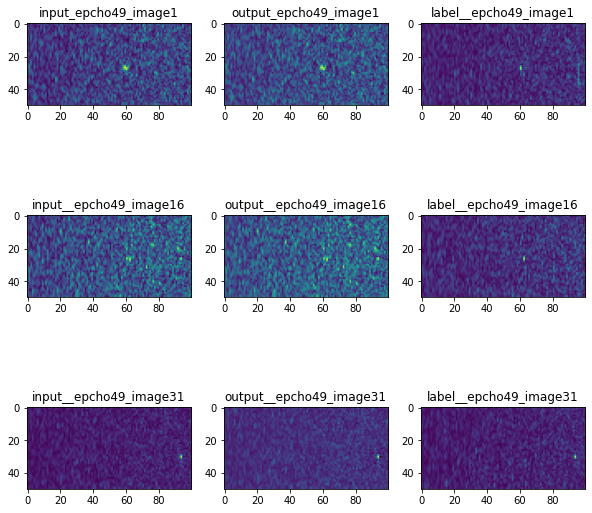

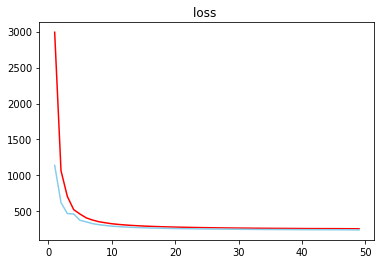

In [ ]:

if __name__ == '__main__':

    batch_size = 32
    lr=1e-7
    #lr=1e-4#loss:11.72 10.74
    #lr=1e-3#9.6519
    #lr=0.01#8.3690
    #lr=0.1#8.2 7.72 7.71 ..7156.7147
    log_dir='/content/drive/My Drive/model.pth'
    #数据集加载
    dataset_path = '/content/drive/My Drive/'
    x_train, y_train, x_dev, y_dev = get_data(dataset_path, 'TrainData5.mat', 'IdealData5.mat', 0.2)
    #print(x_train[0])
    train_dataset = MyDataset(x_train, y_train)
    train_loader = DataLoader(train_dataset, batch_size=batch_size)
    dev_dataset = MyDataset(x_dev, y_dev)
    dev_loader = DataLoader(train_dataset, batch_size=batch_size)

    model = DnCNN()
    #模型加载
    start_epoch=0
    '''
    if os.path.exists(log_dir):
        checkpoint = torch.load(log_dir)
        model.load_state_dict(checkpoint['net'])
        start_epoch = checkpoint['epoch']
        print('加载 epoch {} 成功！'.format(start_epoch))
    else:
        start_epoch = 0
        print('无保存模型，将从头开始训练！')
    '''
    sgd = SGD(model.parameters(), lr)

    cost = CrossEntropyLoss()
    criterion = MSELoss(reduction='sum')
    epoch = 50
    use_GPU = True
    if use_GPU:
        device = torch.device("cuda")
    else:
        device = torch.device("cpu")
    model.to(device)
    epoch_train_loss_list = []
    epoch_dev_loss_list = []
    epoch_train_acc_list = []
    epoch_dev_acc_list = []
    for _epoch in range(start_epoch+1,start_epoch+epoch):
        model.train()
        epoch_train_loss = 0
        epoch_dev_loss = 0
        epoch_train_acc = 0
        epoch_dev_acc = 0
        train_num=0
        dev_num = 0
        for idx, (train_x, train_label) in enumerate(train_loader):
            s = train_label.shape[0]
            sgd.zero_grad()
            predict_y = model(train_x.to(device))

            loss = criterion(predict_y, train_label.to(device)) / (2 * len(train_x))
            epoch_train_loss += loss.item()
            label_pred = np.argmax(predict_y.cpu().data.numpy(), axis=1)
            #acc = np.sum(label_pred == train_label.numpy())
            # print("batch Train acc:",acc / s)
            #epoch_train_acc += acc / s
            train_num+=1
            loss.backward()
            sgd.step()

        correct = 0
        _sum = 0
        model.eval()

        with torch.no_grad():
            for idx, (dev_x, dev_label) in enumerate(dev_loader):
                s = dev_label.shape[0]
                predict_y = model(dev_x.to(device))
                # print(predict_y[0], dev_label[0])
                loss = criterion(predict_y, train_label.to(device)) / (2 * len(train_x))
                epoch_dev_loss += loss.item()
                label_pred = np.argmax(predict_y.cpu().data.numpy(), axis=1)
                # print("------")
                # print(label_pred)
                # print(dev_label.numpy())
                # print("------")
                #acc = np.sum(label_pred == dev_label.numpy())
                #batch_acc=acc / s
                dev_num+=1
                # print("batch_acc::",batch_acc)
                #epoch_dev_acc += acc / s
                # print("devacc", acc);
        epoch_train_loss_list.append(epoch_train_loss / train_num)
        epoch_dev_loss_list.append(epoch_dev_loss / train_num)

        #epoch_train_acc_list.append(epoch_train_acc / dev_num)
        #epoch_dev_acc_list.append(epoch_dev_acc / dev_num)
        print('-------------------------------------------------------------------------------------------------------------------------------------')
        print("epoch {:.4f} ,train loss: {:.4f}, dev loss: {:.4f}".format(_epoch, epoch_train_loss / train_num, epoch_dev_loss / dev_num))
        print('-------------------------------------------------------------------------------------------------------------------------------------')
        #绘图
        y_show = predict_y.reshape([batch_size, 50, 100])
        y_show = y_show.cpu().data.numpy()
        
        #print(train_x.size())
        x_show_x=train_x.squeeze(1)
        label_show=train_label.reshape([batch_size,50, 100])
        label_show=label_show.cpu().data.numpy()
        #print(x_show_x.size())
        x_show= x_show_x.numpy()
        y_show=x_show-y_show
        label_show=x_show-label_show
        #print(len(y_show[batch_size-1]))
        im1=1
        im2=int(batch_size/2)
        im3=batch_size-1
        pylab.figure(figsize=(10,10))
        plot = 'plot' + str(_epoch)
        plot = pylab.subplot(3, 3, 1)
        pylab.title('input_epcho'+str(_epoch)+'_image'+str(im1))
        pylab.imshow(np.asarray(x_show[im1]))
        plot = pylab.subplot(3, 3, 2)
        pylab.title('output_epcho'+str(_epoch)+'_image'+str(im1))
        pylab.imshow(np.asarray(y_show[im1]))
        plot = pylab.subplot(3, 3, 3)
        pylab.title('label__epcho'+str(_epoch)+'_image'+str(im1))
        pylab.imshow(np.asarray(label_show[im1]))
        plot = pylab.subplot(3, 3, 4)
        pylab.title('input__epcho'+str(_epoch)+'_image'+str(im2))
        pylab.imshow(np.asarray(x_show[im2]))
        plot = pylab.subplot(3, 3, 5)
        pylab.title('output__epcho'+str(_epoch)+'_image'+str(im2))
        pylab.imshow(np.asarray(y_show[im2]))
        plot = pylab.subplot(3, 3, 6)
        pylab.title('label__epcho'+str(_epoch)+'_image'+str(im2))
        pylab.imshow(np.asarray(label_show[im2]))
        plot = pylab.subplot(3, 3, 7)
        pylab.title('input__epcho'+str(_epoch)+'_image'+str(im3))
        pylab.imshow(np.asarray(x_show[im3]))
        plot = pylab.subplot(3, 3, 8)
        pylab.title('output__epcho'+str(_epoch)+'_image'+str(im3))
        pylab.imshow(np.asarray(y_show[im3]))
        plot = pylab.subplot(3, 3, 9)
        pylab.title('label__epcho'+str(_epoch)+'_image'+str(im3))
        pylab.imshow(np.asarray(label_show[im3]))
        pylab.show()
        '''
        y_show=predict_y.reshape([batch_size,50,100])
        print(y_show.size())
        #y_show=y_show.cpu().data.numpy()
        #imgs_sample = [y_show[i] for i in range(16,32)]
        y_show = y_show.unsqueeze(1)
        print(y_show.size())
        grid_img = torchvision.utils.make_grid(y_show.cpu(), nrow=4)
        plt.figure(figsize=(10, 10))  # 画图
        plt.imshow(grid_img)
        plt.show()  # 展示图片
        '''

    t = np.arange(1, len(epoch_train_loss_list) + 1)
    #模型保存
    
    state = {'net':model.state_dict(),  'epoch':epoch}
    torch.save(state, log_dir)
    #acc_plot = plt.subplot(2, 2, 1)
    #plt.title('acc')
    #plt.plot(t, epoch_train_acc_list, color='red', label='train acc')
    #plt.plot(t, epoch_dev_acc_list, color='blue', label='dev acc')
    loss_plot = plt.subplot(1, 1, 1)
    plt.title('loss ')
    plt.plot(t, epoch_train_loss_list, color='red', label='train loss')
    plt.plot(t, epoch_dev_loss_list, color='skyblue', label='dev loss')